In [ ]:
import pandas as pd

In [ ]:
"""
Perceptron Classifier Animation
- Trains a linear perceptron to classify 'Diabetic' based on 'BloodSugar' and 'BMI' (2 parameters).
- Features are standardized to zero mean and unit variance because values of BloodSugar were in the range of 150-300 and BMI was having values in range of 15-30.
- Uses perceptron update rule called Perceptron trick:
      w <- w + lr * (y - y_hat) * x
- At each epoch, saves weights to visualize how the decision boundary evolves.
- Animated plot shows training progression over epochs.
"""

Matplotlib is building the font cache; this may take a moment.


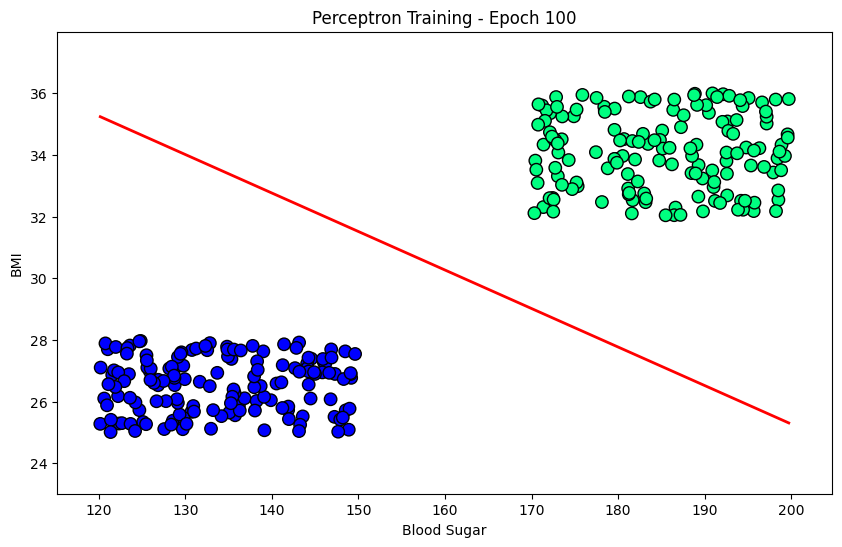

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Load the dataset
df = pd.read_csv("diabetes_dataset_linear.csv")

# Prepare features and labels
X = df[["BloodSugar", "BMI"]].values
y = df["Diabetic"].values

# Manually standardize (zero mean, unit variance)
X_mean = X.mean(axis=0)
X_std = X.std(axis=0)
X_scaled = (X - X_mean) / X_std

# Insert bias column (intercept term)
X_bias = np.insert(X_scaled, 0, 1, axis=1)

# Initialize weights to zeros
weights = np.zeros(X_bias.shape[1])

# Learning rate
lr = 0.01

# Number of epochs
epochs = 100

# Store weights after each epoch
weight_history = [weights.copy()]

# Perceptron training
for epoch in range(epochs):
    for xi, target in zip(X_bias, y):
        activation = np.dot(xi, weights)
        y_hat = 1 if activation >= 0 else 0
        weights += lr * (target - y_hat) * xi
    weight_history.append(weights.copy())

# Set up the figure
fig, ax = plt.subplots(figsize=(10,6))

# Scatter plot of data points (use original X for labeling)
scatter = ax.scatter(X[:,0], X[:,1], c=y, cmap="winter", s=80, edgecolors="k")
line, = ax.plot([], [], 'r-', linewidth=2)

ax.set_xlim(X[:,0].min()-5, X[:,0].max()+5)
ax.set_ylim(X[:,1].min()-2, X[:,1].max()+2)
ax.set_xlabel("Blood Sugar")
ax.set_ylabel("BMI")

# Update function for animation
def update(frame):
    w = weight_history[frame]
    
    # Compute line in scaled space
    if w[2] != 0:
        # Line in scaled space: m_scaled * x_scaled + b_scaled
        m_scaled = -w[1] / w[2]
        b_scaled = -w[0] / w[2]

        # Convert scaled x back to original x
        x_vals_scaled = np.array([
            (X[:,0].min() - X_mean[0]) / X_std[0],
            (X[:,0].max() - X_mean[0]) / X_std[0]
        ])

        y_vals_scaled = m_scaled * x_vals_scaled + b_scaled

        # Convert scaled y back to original y
        y_vals = y_vals_scaled * X_std[1] + X_mean[1]
        x_vals = x_vals_scaled * X_std[0] + X_mean[0]

        line.set_data(x_vals, y_vals)
    else:
        line.set_data([], [])
    ax.set_title(f"Perceptron Training - Epoch {frame}")
    return line,

# Create animation
anim = FuncAnimation(fig, update, frames=len(weight_history), interval=300, blit=True)

# Display animation inline
HTML(anim.to_jshtml())
